## 1. 大数の法則を実感

In [2]:
using LinearAlgebra, Distributions

In [3]:
#好きな確率分布を入れよう
p = Normal(0, 1) #正規分布
p1 = Poisson(1) #ポアソン分布
p2 = Cauchy(0, 1) #コーシー分布(期待値や分散が定義出来ない分布であり、大数の法則が成り立たない分布)

Cauchy{Float64}(μ=0.0, σ=1.0)

In [4]:
n_sample = 500
sample_n = rand(p, n_sample) #確率分布pに従い、sampleを取ってくる
sample_p = rand(p1, n_sample) #確率分布p1に従い、sampleを取ってくる
sample_c = rand(p2, n_sample) #確率分布p2に従い、sampleを取ってくる

500-element Vector{Float64}:
   1.382133474197283
  -1.263588384936921
 -13.703222206074368
   0.06042317214146104
   0.9762637736924265
  -1.2089068804807435
  -1.2230447919100256
   1.9830095196074422
  -0.5829441649805417
   1.2285741196881228
   ⋮
  -1.653083875845164
  -0.1882494805781733
  -1.195262614077929
   0.3842239768064642
  -0.16727869029129214
   5.139177258182452
   2.1080031219772173
  -0.36436249826634026
  -0.7093905273248102

In [5]:
using Plots

In [6]:
xn = collect(-10.0:0.1:10.0)
xp = collect(0:1:20)
xc = collect(-10.0:0.1:10.0)
pd(x) = pdf(p, x)
pd1(x) = pdf(p1, x)
pd2(x) = pdf(p2, x)

pd2 (generic function with 1 method)

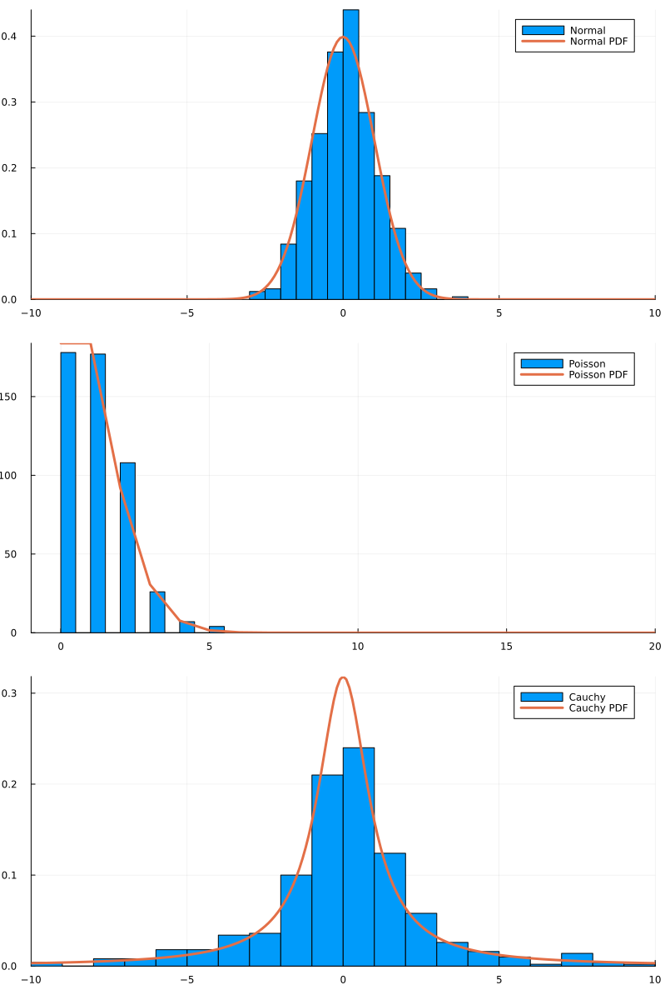

In [7]:
pn = histogram(sample_n, label="Normal", normalize=:pdf, xrange=(-10.0,10.0))
pn = plot!(xn, pd.(xn),linewidth=3.0, label="Normal PDF")
pp = histogram(sample_p, label="Poisson", xrange=(-1.0,20.0))#規格化がバグっていたので使わない
pp = plot!(xp, n_sample.*pd1.(xp),linewidth=3.0, label="Poisson PDF")#代わりにn_sampleをこっちにかける
pc = histogram(sample_c, label="Cauchy", normalize=:pdf, xrange=(-10.0,10.0))
pc = plot!(xc, pd2.(xc),linewidth=3.0, label="Cauchy PDF")
plot(pn, pp, pc, layout=(3,1), size=(800, 1200), legend=:topright)

サンプル増やしてみるとちゃんとだいたい元の分布に一致する

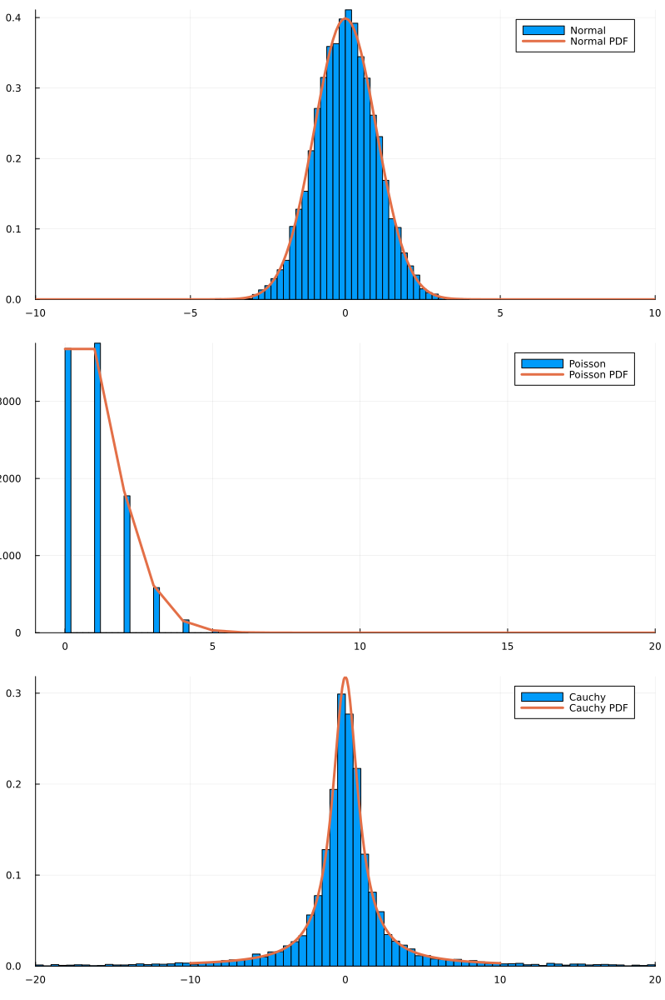

In [18]:
n_sample = 10000
sample_n = rand(p, n_sample) #確率分布pに従い、sampleを取ってくる
sample_p = rand(p1, n_sample) #確率分布p1に従い、sampleを取ってくる
sample_c = rand(p2, n_sample) #確率分布p2に従い、sampleを取ってくる
pn = histogram(sample_n, label="Normal", normalize=:pdf, xrange=(-10.0,10.0))
pn = plot!(xn, pd.(xn),linewidth=3.0, label="Normal PDF")
pp = histogram(sample_p, label="Poisson", xrange=(-1.0,20.0))#規格化がバグっていたので使わない
pp = plot!(xp, n_sample.*pd1.(xp),linewidth=3.0, label="Poisson PDF")#代わりにn_sampleをこっちにかける
pc = histogram(sample_c, label="Cauchy", normalize=:pdf, xrange=(-20.0,20.0))
pc = plot!(xc, pd2.(xc),linewidth=3.0, label="Cauchy PDF")
plot(pn, pp, pc, layout=(3,1), size=(800, 1200), legend=:topright)

サンプル平均のサンプルを取ってみる

In [8]:
n_trial = 1000
n_sample = 1000
normal_means = zeros(n_trial)
poisson_means = zeros(n_trial)
cauchy_means = zeros(n_trial)
for it in 1:n_trial
    #サンプリング
    normal_means[it] = mean(rand(p, n_sample))
    poisson_means[it] = mean(rand(p1, n_sample))
    cauchy_means[it] = mean(rand(p2, n_sample))
end
println("Normal: μ=", mean(normal_means), ", σ=", sqrt(var(normal_means)))
println("Poisson: μ=", mean(poisson_means), ", σ=", sqrt(var(poisson_means)))
println("Cauchy: μ=", mean(cauchy_means), ", σ=", sqrt(var(cauchy_means)))

Normal: μ=-0.00012411009628799497, σ=0.030961959721912714
Poisson: μ=1.000026, σ=0.03292569551923582
Cauchy: μ=0.5838328471792179, σ=21.548602682260956


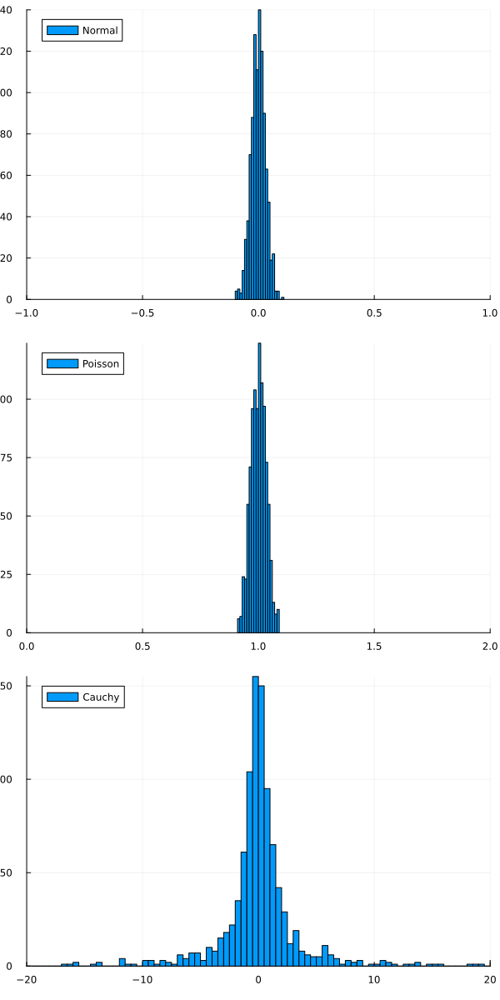

In [9]:
pn = histogram(normal_means, label="Normal", bins=20, xrange=(-1.0,1.0))
pp = histogram(poisson_means, label="Poisson", bins=20, xrange=(0.0,2.0))
pc = histogram(cauchy_means, label="Cauchy", xrange=(-20.0,20.0))
plot(pn, pp, pc, layout=(3,1), size=(600, 1200), legend=:topleft)

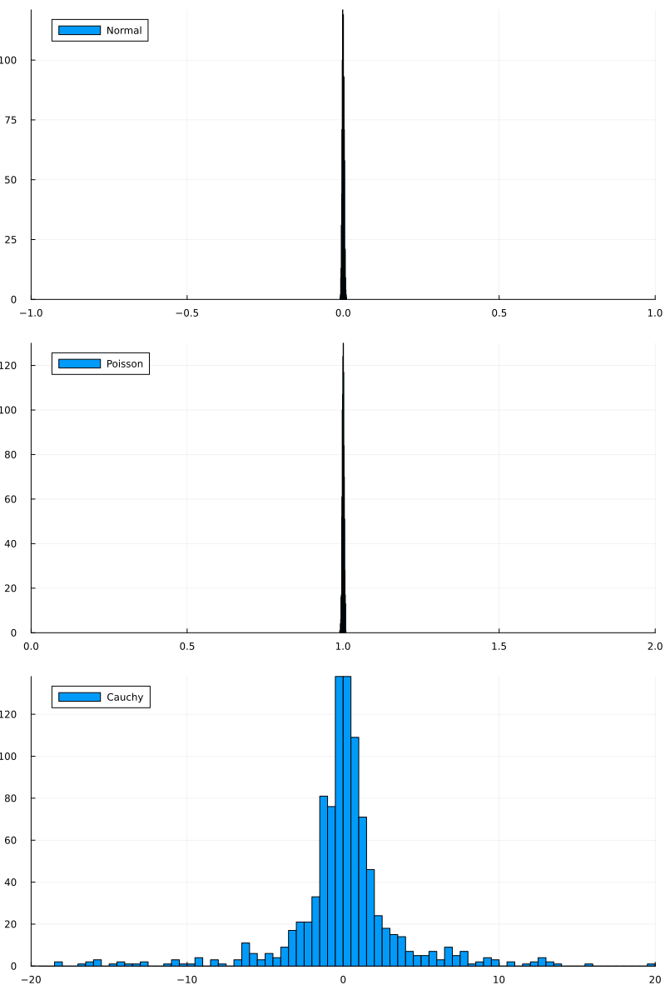

In [40]:
n_trial = 1000
n_sample = 100000
normal_means = zeros(n_trial)
poisson_means = zeros(n_trial)
cauchy_means = zeros(n_trial)
for it in 1:n_trial
    #サンプリング
    normal_means[it] = mean(rand(p, n_sample))
    poisson_means[it] = mean(rand(p1, n_sample))
    cauchy_means[it] = mean(rand(p2, n_sample))
end
pn = histogram(normal_means, label="Normal", bins=20, xrange=(-1.0,1.0))
pp = histogram(poisson_means, label="Poisson", bins=20, xrange=(0.0,2.0))
pc = histogram(cauchy_means, label="Cauchy", xrange=(-20.0,20.0))
plot(pn, pp, pc, layout=(3,1), size=(800, 1200), legend=:topleft)

確かに確率１で期待値の値を取りそう(確率収束していそう)

### 例題
一様分布 $x \in [-3,3]$の平均と分散を確認し、これらのサンプル平均のサンプルに対して大数の法則が成り立つことを確認せよ(`julia 一様分布`等で検索し、書き方を調べると良い。)

## 中心極限定理を体感

先ほどのコードでポアソン分布のサンプル平均の分布が、期待値$1$、分散$1/N_{sample}$のガウス分布に近づいているのか、確認してみよう

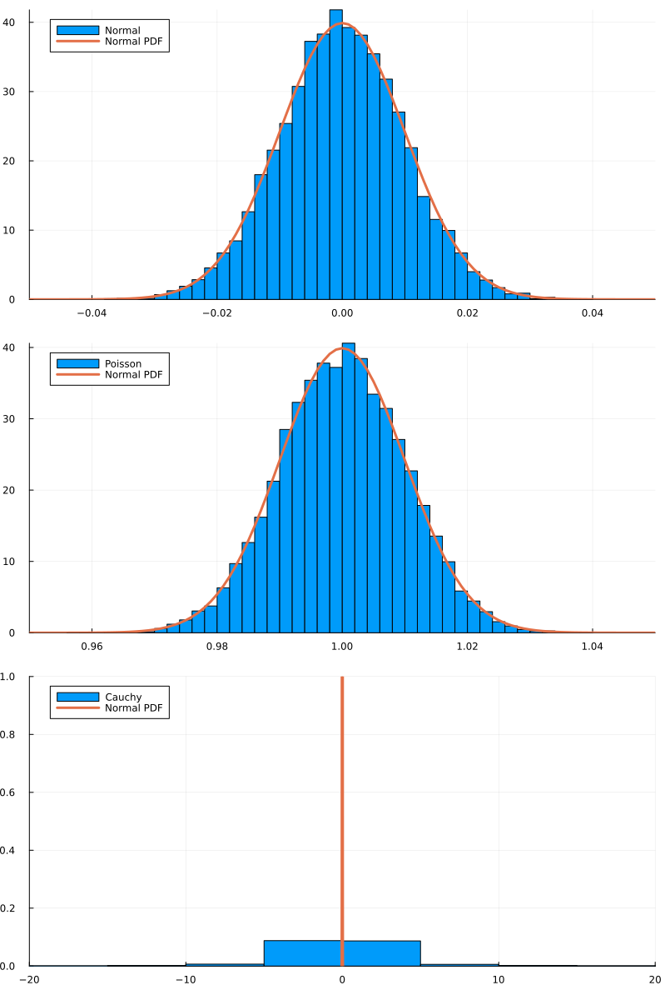

In [10]:
n_trial = 10000
n_sample = 10000
normal_means = zeros(n_trial)
poisson_means = zeros(n_trial)
cauchy_means = zeros(n_trial)
for it in 1:n_trial
    #サンプリング
    normal_means[it] = mean(rand(p, n_sample))
    poisson_means[it] = mean(rand(p1, n_sample))
    cauchy_means[it] = mean(rand(p2, n_sample))
end
ns = sqrt(n_sample)
xnn = collect(-5.0/ns:0.1/ns:5.0/ns)
pn = histogram(normal_means, label="Normal", xrange=(-5.0/ns,5.0/ns), normalize=:pdf)
pn = plot!(xnn, pdf(Normal(0, 1/sqrt(n_sample)), xnn),linewidth=3.0, label="Normal PDF")
pp = histogram(poisson_means, label="Poisson", xrange=(1.0-5.0/ns,1.0+5.0/ns), normalize=:pdf)
pp = plot!(1.0.+xnn, pdf(Normal(1, 1/sqrt(n_sample)), 1.0.+xnn),linewidth=3.0, label="Normal PDF")
pc = histogram(cauchy_means, label="Cauchy", xrange=(-20.0,20.0), normalize=:pdf, yrange=(0.0, 1.0))
pc = plot!(xnn, pdf(Normal(0, 1/sqrt(n_sample)), xnn),linewidth=3.0, label="Normal PDF")
plot(pn, pp,pc, layout=(3,1), size=(800, 1200), legend=:topleft)

In [11]:
function central_limit_theorem(n_sample, n_trial)
    normal_means = zeros(n_trial)
    poisson_means = zeros(n_trial)
    cauchy_means = zeros(n_trial)
    for it in 1:n_trial
        #サンプリング
        normal_means[it] = mean(rand(p, n_sample))
        poisson_means[it] = mean(rand(p1, n_sample))
        cauchy_means[it] = mean(rand(p2, n_sample))
    end
    return mean(normal_means), mean(poisson_means), mean(cauchy_means), var(normal_means), var(poisson_means), var(cauchy_means)
end

central_limit_theorem (generic function with 1 method)

In [21]:
N=10
var_normal = zeros(N)
var_poisson = zeros(N)
var_cauchy = zeros(N)
mean_normal = zeros(N)
mean_poisson = zeros(N)
mean_cauchy = zeros(N)

n_samples = [4^i for i in 1:N]
for (i,n_sample) in enumerate(n_samples)
    n_trial =1000
    mean_normal[i], mean_poisson[i], mean_cauchy[i], var_normal[i], var_poisson[i], var_cauchy[i] = central_limit_theorem(n_sample, n_trial) 
end

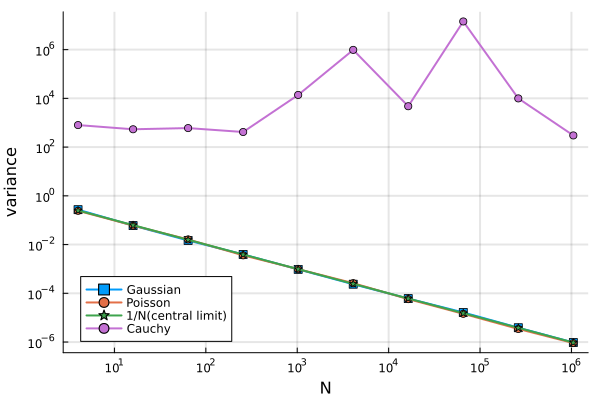

In [24]:
gridwidth = 2
plot(n_samples, var_normal, linewidth=2, marker=:square, label="Gaussian", xaxis=:log, yaxis=:log, xlabel="N", ylabel="variance", xticks=([10,100,1000,10000,100000,1000000]), yticks=([10^-6,10^-4,10^-2,1,10^2,10^4, 10^6]), gridwidth=2.0)
plot!(n_samples, var_poisson, linewidth=2, marker=:circle, label="Poisson", xaxis=:log, yaxis=:log)
plot!(n_samples, 1.0./Float64.(n_samples), linewidth=2, marker=:star, label="1/N(central limit)", xaxis=:log, yaxis=:log)
plot!(n_samples, var_cauchy, linewidth=2, marker=:circle, label="Cauchy", xaxis=:log, yaxis=:log, legend=:bottomleft)

## 典型性の実験

## Markov-Chain Monte Carlo